In [11]:
import os

# Change to the parent directory
os.chdir('../..')

# Verify the path using getcwd()
cwd = os.getcwd()
print("Current working directory:", cwd)

Current working directory: c:\Users\onyer


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from src.file_loader import load_mpr

import src.sysid_util as sid
import os
import re
import scipy as sp
import control as ct

In [14]:
# Load data
mpr_file4 = load_mpr("12to1-25%CNC-3%GQDs _C01.mpr")
df4 = pd.DataFrame(mpr_file4.data)

# Get columns
print("Columns:", df4.columns)
print("Data:", df4['time/s'].head())

df4 = df4.set_index('time/s')[['control/mA', 'Ewe/V']]

print("Columns:", df4.columns)
print("Data:", df4.head())

# # Plotting
# plt.figure(figsize=(12, 6))

# # Plot 'control/mA'
# plt.subplot(2, 1, 1)
# plt.plot(df4.index, df4['control/mA'], color='blue', label='Control (mA)')
# plt.xlabel('Time (s)')
# plt.ylabel('Control (mA)')
# plt.title('Control Current vs. Time')
# plt.legend()

# # Plot 'Ewe/V'
# plt.subplot(2, 1, 2)
# plt.plot(df4.index, df4['Ewe/V'], color='red', label='Ewe (V)')
# plt.xlabel('Time (s)')
# plt.ylabel('Ewe (V)')
# plt.title('Electrode Voltage vs. Time')
# plt.legend()

# # Adjust layout
# plt.tight_layout()
# plt.show()


Columns: Index(['flags', 'Ns', 'time/s', 'control/mA', 'Ewe/V', 'I/mA', 'dQ/C',
       '(Q-Qo)/C', 'half cycle', 'Q charge/discharge/mA.h', 'I Range'],
      dtype='object')
Data: 0     0.000000
1    10.000000
2    19.999999
3    29.999999
4    39.999999
Name: time/s, dtype: float64
Columns: Index(['control/mA', 'Ewe/V'], dtype='object')
Data:            control/mA     Ewe/V
time/s                         
0.000000         0.01  0.407403
10.000000        0.01  0.729420
19.999999        0.01  0.746633
29.999999        0.01  0.757071
39.999999        0.01  0.764113


In [8]:
print(df4['control/mA'].unique())

[ 0.01 -0.01  0.   -0.02  0.02 -0.04  0.04  0.08 -0.08  0.16 -0.16]


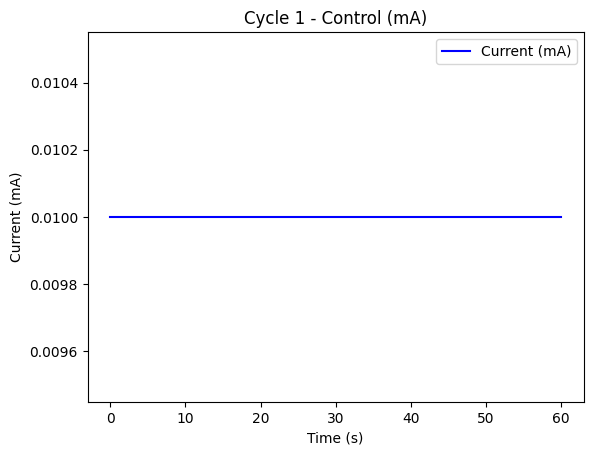

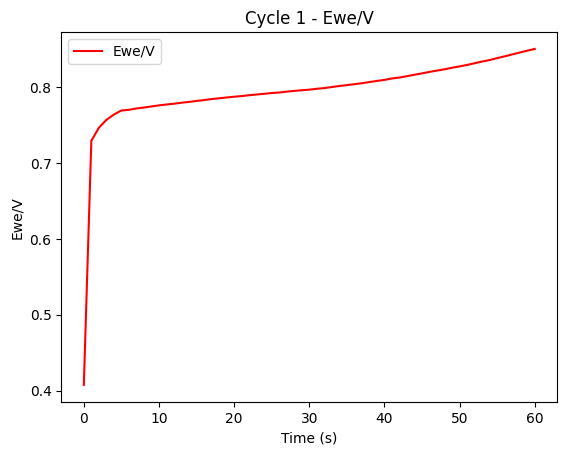

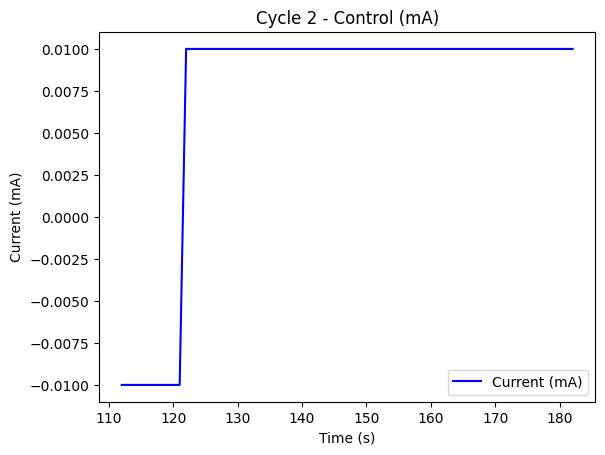

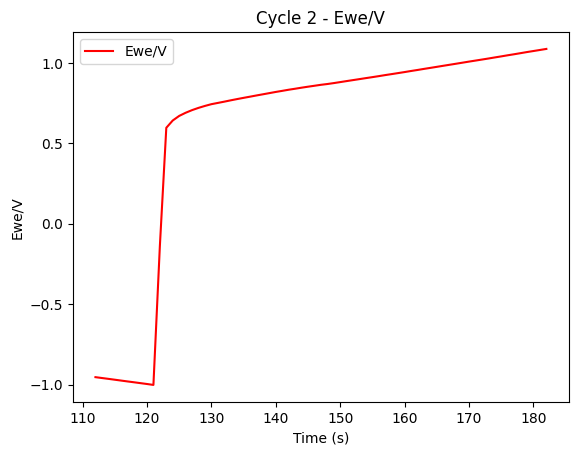

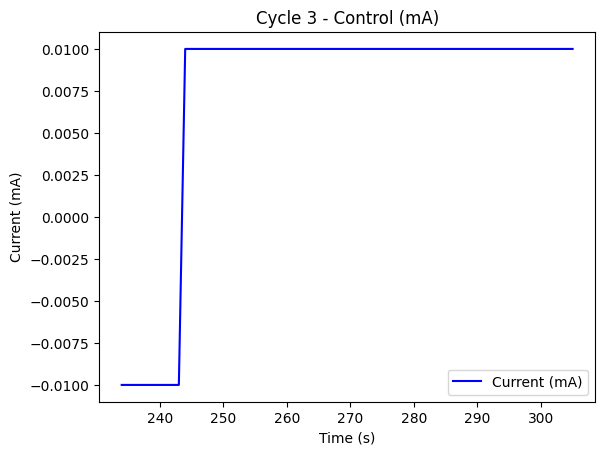

...

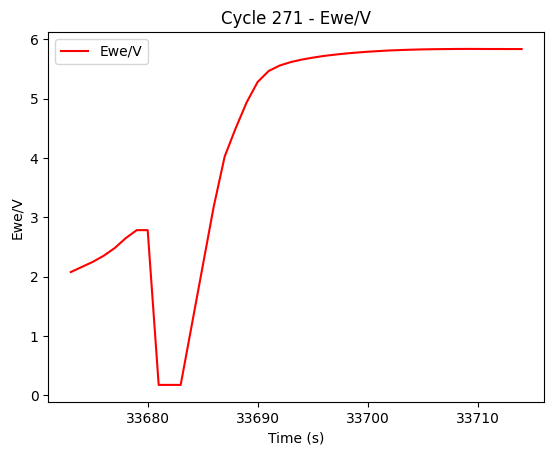

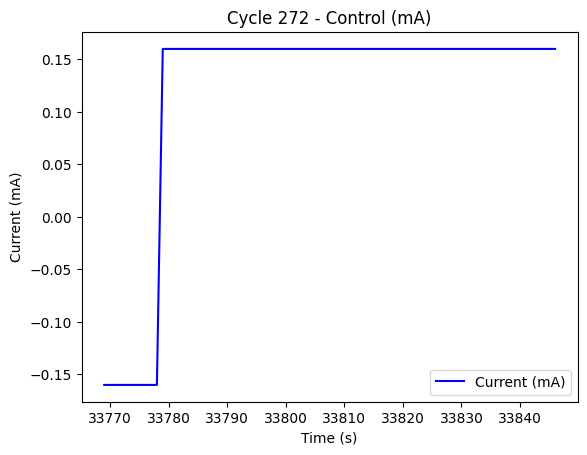

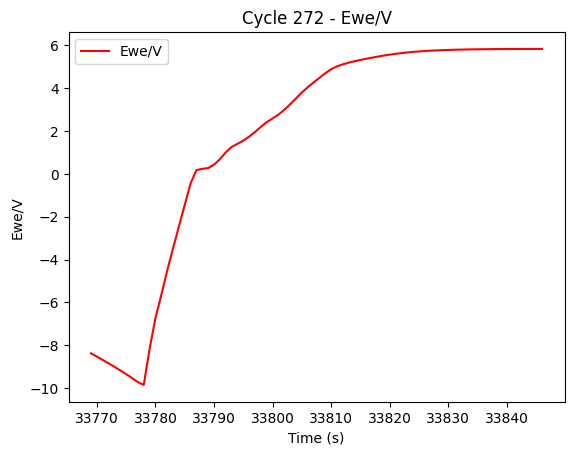

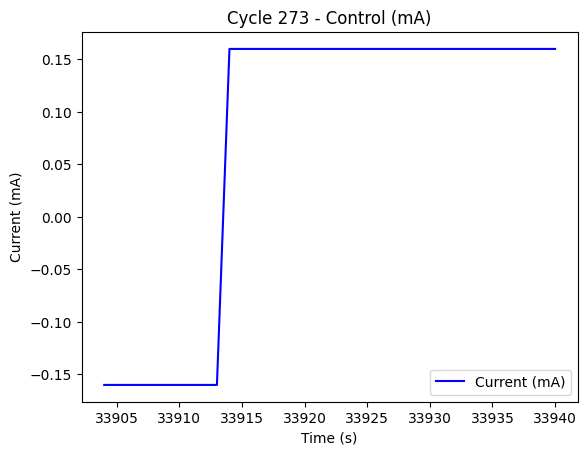

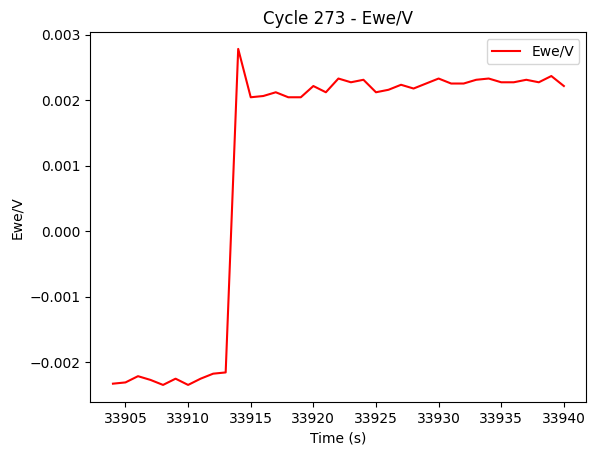

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

def find_charging_cycles(df):
    cycles = []
    current_cycle = []
    # Use df.index for accessing rows
    index = df.index
    i = 0
    while i < len(index):
        control_value = df.loc[index[i], 'control/mA']
        if control_value > 0:
            # Find the start of the cycle (including 10 points from the previous negative part)
            start_time = index[max(0, i-10)]
            current_index = start_time
            # Collect data from start to current index
            while current_index < index[i]:
                current_cycle.append(df.loc[current_index])
                # Move to the next index
                next_index = df.index[df.index.get_loc(current_index) + 1] if (df.index.get_loc(current_index) + 1) < len(df.index) else None
                if next_index is None:
                    break
                current_index = next_index
            while i < len(index) and df.loc[index[i], 'control/mA'] > 0:
                current_cycle.append(df.loc[index[i]])
                i += 1
            # End of the cycle, add it to cycles list
            cycles.append(pd.DataFrame(current_cycle))
            current_cycle = []
        else:
            i += 1
    return cycles


# Function to visualize the cycles
def plot_cycles(cycles):
    for idx, cycle in enumerate(cycles):
        # Plot control/mA in one graph
        plt.figure()
        plt.plot(cycle.index, cycle['control/mA'], 'b-', label='Current (mA)')
        plt.xlabel('Time (s)')
        plt.ylabel('Current (mA)')
        plt.title(f'Cycle {idx+1} - Control (mA)')
        plt.legend()
        plt.show()

        # Plot Ewe/V in a separate graph
        plt.figure()
        plt.plot(cycle.index, cycle['Ewe/V'], 'r-', label='Ewe/V')
        plt.xlabel('Time (s)')
        plt.ylabel('Ewe/V')
        plt.title(f'Cycle {idx+1} - Ewe/V')
        plt.legend()
        plt.show()


# Assuming df4 is your DataFrame
cycles = find_charging_cycles(df4)

# Plot the cycles
plot_cycles(cycles)


In [ ]:
df4.columns

Index(['flags', 'Ns', 'time/s', 'control/mA', 'Ewe/V', 'I/mA', 'dQ/C',
       '(Q-Qo)/C', 'half cycle', 'Q charge/discharge/mA.h', 'I Range'],
      dtype='object')

In [ ]:

# output_col = 'Ewe/V'
# input_col = 'control/mA'
# charging_cycles = find_charging_cycles(df4)

# tt, yy = list(zip(*charging_cycles))

# # Inspect the contents of yy
# print("yy:", yy)
# # Inspect the contents of yy
# print("tt:", tt)
# # Helper function to check if a value is numeric
# def is_float(value):
#     try:
#         float(value)
#         return True
#     except ValueError:
#         return False

# # Ensure yy contains only numeric data
# yy = [float(val) for val in yy if is_float(val)]

# # Check if yy is empty after filtering
# if len(yy) == 0:
#     print("No numeric values found in yy.")
# else:
#     # Convert yy to a numpy array
#     # yy = np.array(yy, dtype=float)

#     uu = np.ones(len(yy))
#     uu = np.concatenate((np.zeros(10), uu))
#     yy = np.concatenate((yy[0] * np.ones(10), yy))
#     yy = yy - yy[0] * np.ones(len(yy))

#     # Print the result to verify
#     print("Processed yy:", yy)
#     print("Processed uu:", uu)

In [21]:
import pandas as pd
import numpy as np

# Assuming the find_charging_cycles function is already defined

def find_charging_cycles(df):
    cycles = []
    current_cycle = []
    i = 0
    while i < len(df):
        control_value = df.loc[i, 'control/mA']
        if control_value > 0:
            # Find the start of the cycle (including 10 points from the previous negative part)
            start = max(0, i-10)
            jj = start
            while jj < i:
                current_cycle.append(df.iloc[jj])
                jj += 1
            while i < len(df) and df.loc[i, 'control/mA'] > 0:
                current_cycle.append(df.iloc[i])
                i += 1
            # End of the cycle, add it to cycles list
            cycles.append(pd.DataFrame(current_cycle))
            current_cycle = []
        else:
            i += 1
    return cycles

# Run the find_charging_cycles function
charging_cycles = find_charging_cycles(df4)

# Extracting 'Ewe/V' and 'control/mA' for each cycle
yy = [cycle['Ewe/V'].values for cycle in charging_cycles]
uu = [cycle['control/mA'].values for cycle in charging_cycles]
tt = [cycle['time/s'].values for cycle in charging_cycles]

In [22]:
import matplotlib.pyplot as plt

# Determine the number of cycles
num_cycles = len(yy)

# Create subplots with a grid layout, one plot for each cycle
fig, axes = plt.subplots(num_cycles, 1, figsize=(8, num_cycles * 3))

# If there is only one cycle, axes will not be a list, so we handle that
if num_cycles == 1:
    axes = [axes]

# Plot each charging cycle in its own subplot
for i, (y, u) in enumerate(zip(yy, uu)):
    axes[i].plot(y, label='Ewe/V')
    axes[i].plot(u, label='control/mA')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Value')
    axes[i].set_title(f'Charging Cycle {i+1}')
    axes[i].legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


ValueError: Image size of 800x81900 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive at 0x000001D09C67C9A0> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 800x81900 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 800x81900 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 800x81900 with 273 Axes>

In [13]:
nf = 3
nb = 3
nc = 0
nd = 0
na = nf
nk = 4
   
n_arx = [nf, nb, nk]
theta_arx = sid.V_arx_lin_reg(n_arx,yy,uu)

theta_box_jenkins = np.concatenate((theta_arx[n_arx[0]:np.sum(n_arx)],np.zeros(nc+nd),theta_arx[0:n_arx[0]])) 
n_bj = [nb, nc, nd, nf, nk]

optimization_results = sp.optimize.least_squares(sid.V_box_jenkins, theta_box_jenkins, jac=sid.jac_V_bj, args=(n_bj,yy,uu))

In [14]:
print(optimization_results)

     message: `ftol` termination condition is satisfied.
     success: True
      status: 2
         fun: [ 0.000e+00  0.000e+00 ...  6.086e-03  6.944e-03]
           x: [ 8.462e-01 -9.205e-02 -7.369e-01 -9.736e-01 -8.516e-02
                6.456e-02]
        cost: 0.001168016383435558
         jac: [[ 0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
               [ 0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
               ...
               [-5.198e+01 -5.124e+01 ...  9.382e+01  9.225e+01]
               [-5.271e+01 -5.198e+01 ...  9.540e+01  9.382e+01]]
        grad: [-6.061e-12 -5.650e-12 -5.962e-12  3.491e-08 -3.206e-08
               -4.255e-08]
  optimality: 4.254637242517845e-08
 active_mask: [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00
                0.000e+00]
        nfev: 12
        njev: 11


<TransferFunction>: sys[637]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


    0.8462 z^3 - 0.09205 z^2 - 0.7369 z
--------------------------------------------
z^7 - 0.9736 z^6 - 0.08516 z^5 + 0.06456 z^4

dt = 0.005

[ 0.98917446+0.j -0.88039465+0.j  0.        +0.j]
[ 0.99394804+0.j -0.26523233+0.j  0.24490985+0.j  0.        +0.j
  0.        +0.j  0.        +0.j  0.        +0.j]


Text(0, 0.5, 'Voltage')

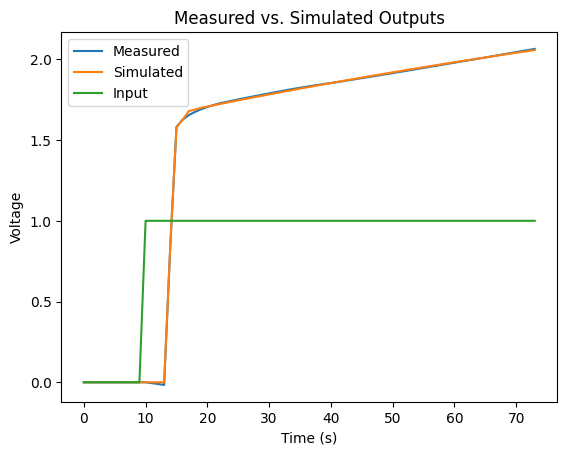

In [15]:
Ts = 0.005
G_hat_box_jenkins,H_hat_box_jenkins=sid.theta_2_tf_box_jenkins(optimization_results.x,n_bj,Ts)

print(G_hat_box_jenkins)

print(G_hat_box_jenkins.zeros())
print(G_hat_box_jenkins.poles())

tt, y_sim = ct.forced_response(G_hat_box_jenkins,U=uu)
fig,ax = plt.subplots(1)
ax.plot(yy,label='Measured')
ax.plot(y_sim,label='Simulated')
ax.plot(uu,label='Input')
ax.legend()
ax.set_title('Measured vs. Simulated Outputs')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Voltage')

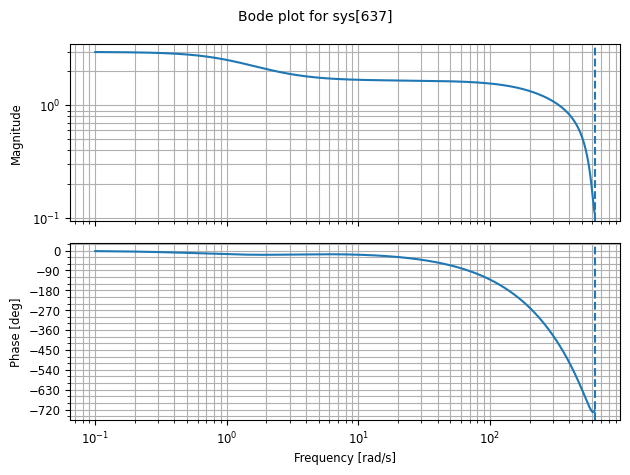

In [16]:
out=ct.bode_plot(G_hat_box_jenkins)

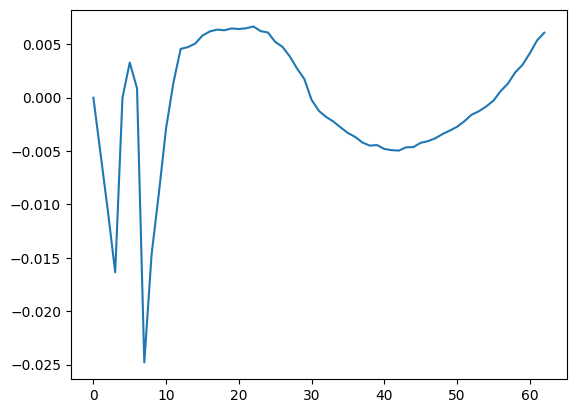

In [17]:
t0 = 10
epsilon = yy[t0:-1] - y_sim[t0:-1]
fig,ax = plt.subplots(1)
ax.plot(epsilon)


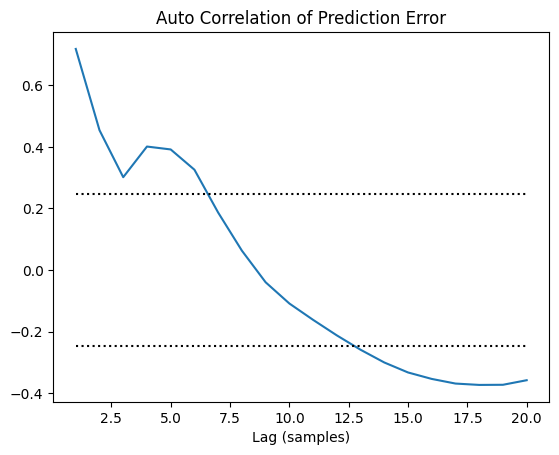

In [18]:
sid.auto_correlation_test(epsilon,tau=20)